# Labkit Track Analysis
- *Bel Taylor-Hearn, 2025*
- WORK IN PROGRESS!
- Aim to quantify the motion of cells within an acinus *relative to* the (moving) centre of mass of the acinus
- Aim to understand whether cells rotate collectively within the acinus, and if this is disrupted by changes in mechanical stiffness
- Also aim to understand whether cell motility (e.g. net motion per timestep, directional motion) is affected by changes in mechanical stiffness



In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
import os
import pathlib
from tqdm import tqdm
from joblib import Parallel, delayed
import contextlib

import warnings
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from matplotlib.ticker import MaxNLocator

from skimage.measure import regionprops, regionprops_table

from scipy import ndimage as ndi
from tifffile import imread
import imageio
import napari
import plotly.graph_objects as go

import math
import random
import colorsys
from PIL import ImageColor 

In [ ]:
@contextlib.contextmanager
def tqdm_joblib(tqdm_object):
    """
    Enables parallel jobs to run and display of a tqdm progress bar.

    Parameters:
    -----------
    tqdm_object : tqdm
        The tqdm progress bar instance to be updated.

    """    class TqdmBatchCompletionCallback(joblib.parallel.BatchCompletionCallBack):
        def __call__(self, *args, **kwargs):
            tqdm_object.update(n=self.batch_size)
            return super().__call__(*args, **kwargs)

    old_batch_callback = joblib.parallel.BatchCompletionCallBack
    joblib.parallel.BatchCompletionCallBack = TqdmBatchCompletionCallback
    try:
        yield tqdm_object
    finally:
        joblib.parallel.BatchCompletionCallBack = old_batch_callback
        tqdm_object.close()

In [ ]:
def calculate_polar_coordinates(row, center):
    """
    Compute polar coordinates (r, theta) for a single object relative to a time-dependent reference center.

    Parameters:
    -----------
    row : pandas.Series
        A row from a DataFrame containing object centroids and a 'frame' value, typically from `regionprops_table`.
        Expected keys in `row`: 
            - 'frame': integer frame index
            - 'centroid-0': z-coordinate
            - 'centroid-1': y-coordinate
            - 'centroid-2': x-coordinate

    center : dict
        A dictionary mapping frame indices to dictionaries containing the centroid of the central reference point
        for each frame. Each entry should include:
            - 'centroid-0': z-coordinate
            - 'centroid-1': y-coordinate
            - 'centroid-2': x-coordinate

    Returns:
    --------
    pandas.Series
        A Series containing:
            - 'r': radial distance from the reference center
            - 'theta': azimuthal angle in the x–y plane (radians), computed as arctan2(y, x)

    Notes:
    ------
    - This function assumes centroids are in (z, y, x) format.
    - The radius `r` is computed in 3D (xyz), while `theta` is the angular orientation in the xy-plane.
    - Useful for quantifying spatial organization (e.g. radial alignment or clustering) of objects around a central structure (e.g. duct or nucleus).
    
    Example:
    --------
    >>> df[['r', 'theta']] = df.apply(calculate_polar_coordinates, axis=1, center=centroids_by_frame)
    """
    # Get the center for the current frame
    frame_center = center[row['frame']]
    
    # Calculate relative coordinates
    x = row['centroid-0'] - frame_center['centroid-0']
    y = row['centroid-1'] - frame_center['centroid-1']
    z = row['centroid-2'] - frame_center['centroid-2']
    
    # Compute polar coordinates
    r = np.sqrt(x**2 + y**2 + z**2)
    theta = np.arctan2(y, x)
    return pd.Series({'r': r, 'theta': theta})

In [ ]:
def add_image_details(df, filename):
    """
    Annotate a DataFrame with metadata extracted from the image filename.

    Parameters:
    -----------
    df : pandas.DataFrame
        A DataFrame containing per-image or per-object data to be annotated.
    
    filename : str
        The name of the image file used to infer experimental metadata such as condition and treatment.

    Returns:
    --------
    df : pandas.DataFrame
        The input DataFrame with the following additional columns:
            - 'filename': the provided filename
            - 'condition': inferred from the presence of 'soft' or 'stiff' in the filename
            - 'treatment': inferred from substrings like 'bleb', 'rock', 'batimastat', 'mmpi', or 'abt'
            - 'image_type': a composite label combining 'condition' and 'treatment'

    Inference Rules:
    ----------------
    - Treatment is set if the filename contains (case-insensitive):
        * 'bleb' → 'blebbistatin'
        * 'rock' → 'ROCKi'
        * 'batimastat' or 'mmpi' → 'batimastat'
        * 'abt' → 'ABT737'
        * none of the above → empty string
    - The 'image_type' column combines 'condition' and 'treatment' for easier grouping/labeling.

    Notes:
    ------
    - This function assumes filename-based encoding of experimental conditions.
    """
    df["filename"] = filename
    # Stiffness
    if 'soft' in filename:
        df["condition"] =  'soft'
    elif 'stiff' in filename:
        df["condition"] =  'stiff'
    else:
        df["condition"] =  'blank'
    if "bleb" in filename.lower():
        df["treatment"] = "blebbistatin"
    elif "rock" in filename.lower():
        df["treatment"] = "ROCKi"
    elif ("batimastat" in filename.lower()) or "mmpi" in filename.lower():
        df["treatment"] = "batimastat"
    elif "abt" in filename.lower():
        df["treatment"] = "ABT737"
    else:
        df["treatment"] = ""
    df['image_type'] = df["condition"].astype(str) + ", " + df["treatment"].astype(str)
    return df

In [ ]:
def create_palette(n, base_color_hex):
    """
    Generate a colour palette by adjusting the lightness of a given base colour.

    Parameters:
    ----------
    n : int
        Number of colours to generate in the palette.
    base_color_hex : str
        Base colour in hexadecimal format (e.g., "#FF5733") to derive the palette from.

    Returns:
    -------
    palette : list of tuples
        A list of RGB colour tuples (with values between 0 and 1), representing the palette.
        The colours vary in lightness while maintaining the base hue and saturation.
    
    Notes:
    -----
    - Lightness is varied linearly between 70% and 130% of the original colour's lightness. This can be increased for more contrast.
    """
    r,g,b = ImageColor.getcolor(base_color_hex, "RGB")[0], ImageColor.getcolor(base_color_hex, "RGB")[1], ImageColor.getcolor(base_color_hex, "RGB")[2]
    r=r/255
    g=g/255
    b=b/255
    h, l, s = colorsys.rgb_to_hls(r, g, b)
    lightness_adjustments = np.linspace(0.7, 1.3, n)  # Creating a range of values
    # Create the palette with adjusted lightness while keeping hue and saturation constant
    palette = [colorsys.hls_to_rgb(h, min(max(l * adj, 0), 1), s) for adj in lightness_adjustments]
    return palette

In [ ]:

def custom_napari_palette(n_labels): 
    """
    Generate a custom color map for label visualization in Napari.

    Parameters:
    ----------
    n_labels : int
        Number of distinct labels to assign unique colors to.

    Returns:
    -------
    custom_colormap : dict
        A dictionary mapping label indices to RGBA colors.
        - Label 0 is assigned a transparent black ([0, 0, 0, 0]) for the background.
        - Labels 1 to n_labels are assigned distinct RGB colors (with values in [0, 1])
          generated by varying lightness across 7 base hues:
          limegreen, dodgerblue, red, darkorange, yellow, darkviolet, and deeppink.

    Notes:
    -----
    - Colors are randomly shuffled to visually separate adjacent labels.
    - Colors are returned without alpha (RGBA with A=1.0 assumed by Napari).
    """
    n_col = math.ceil(n_labels/7)
    palette_limegreen = create_palette(n_col,"#32CD32")
    palette_dodgerblue = create_palette(n_col, "#1E90FF")
    palette_red = create_palette(n_col, "#FF0000")
    palette_darkorange = create_palette(n_col, "#FF8C00")  
    palette_yellow = create_palette(n_col, "#FFFF00")  
    palette_darkviolet = create_palette(n_col, "#9400D3")  
    palette_deeppink = create_palette(n_col, "#FF1493")  

    combined_palette = palette_limegreen + palette_dodgerblue +palette_darkorange + palette_red+palette_yellow + palette_darkviolet+ palette_deeppink
    random.shuffle(combined_palette)
    custom_colormap = {0: np.array([0., 0., 0., 0.]),} #black backgroun
    for index, element in enumerate(combined_palette):
        custom_colormap[index+1] = element
    return custom_colormap

In [6]:
def calculate_cell_com(trackmate_labels_path):
    all_props = []
    trackmate_labels = imread(trackmate_labels_path)
    for frame in range(trackmate_labels.shape[0]):
        props = pd.DataFrame(regionprops_table(trackmate_labels[frame,:,:], properties =("label", "area", "centroid")))# "inertia_tensor_eigvals")))
        # props["roundness"] = props["inertia_tensor_eigvals-1"]/ props["inertia_tensor_eigvals-0"]
        props["frame"] = frame
        all_props.append(props)
    all_props = pd.concat(all_props)
    filename = os.path.basename(trackmate_labels_path).replace("_", "").lower()
    all_props = add_image_details(all_props, filename)
    all_props.to_csv("{}_output.csv".format(str(os.path.basename(trackmate_labels_path)).replace(".tif","")))
    return all_props

In [ ]:
def cartesian_plots_and_info(df):
    #RELATIVE TO CENTRE
    all_movement_metrics = []
    net_movement_all = []

    for filename in df.filename.unique():
        filtered = df[df["filename"] == filename]
        condition = filtered.condition.unique()[0]
        filtered = filtered.sort_values(by=['label', 'frame'])

        # Group by frame to calculate the COM of the aggregate
        com_by_frame = filtered.groupby('frame')[['centroid-0', 'centroid-1', 'centroid-2']].mean().reset_index()

        # Merge COM information with the filtered DataFrame
        filtered = filtered.merge(com_by_frame, on='frame', suffixes=('', '_com'))

        # Group by label (cell ID)
        grouped = filtered.groupby('label')

        # Dictionary to store movement metrics
        movement_metrics = {}
        net_movement_records = []

        # Calculate movement metrics for each cell
        for label, group in grouped:
            coords = group[['centroid-0', 'centroid-1', 'centroid-2']].to_numpy()
            com_coords = group[['centroid-0_com', 'centroid-1_com', 'centroid-2_com']].to_numpy()

            # Calculate relative displacements (cell displacement minus COM displacement)
            relative_displacements = np.diff(coords - com_coords, axis=0)

            # Calculate total relative displacement for each frame
            frame_displacements = np.linalg.norm(relative_displacements, axis=1)

            # Compute the net relative displacement vector and magnitude over time
            net_relative_displacement_vector = (coords[-1] - com_coords[-1]) - (coords[0] - com_coords[0])
            net_relative_displacement = np.linalg.norm(net_relative_displacement_vector)

            # Store total and net movement metrics
            movement_metrics[label] = {
                'total_relative_distance': np.sum(frame_displacements),
                'net_relative_displacement': net_relative_displacement,
                'net_relative_displacement_x': net_relative_displacement_vector[0],
                'net_relative_displacement_y': net_relative_displacement_vector[1],
                'net_relative_displacement_z': net_relative_displacement_vector[2]
            }

            # Record per-frame relative displacements
            for i in range(1, len(group)):
                frame_prev = group.iloc[i - 1]['frame']
                frame_curr = group.iloc[i]['frame']
                displacement_vector = relative_displacements[i - 1]
                net_movement_records.append({
                    'label': label,
                    'frame': frame_curr,
                    'relative_displacement_x': displacement_vector[0],
                    'relative_displacement_y': displacement_vector[1],
                    'relative_displacement_z': displacement_vector[2],
                    'total_relative_displacement': frame_displacements[i - 1],
                    'filename': filename,
                    'condition': condition
                })

        # Convert to DataFrame and filter non-moving cells
        movement_metrics_df = pd.DataFrame.from_dict(movement_metrics, orient='index')
        movement_metrics_df['filename'] = filename
        movement_metrics_df['condition'] = condition
        movement_metrics_df = movement_metrics_df[movement_metrics_df['total_relative_distance'] != 0]
        all_movement_metrics.append(movement_metrics_df)

        net_movement_df = pd.DataFrame(net_movement_records)
        net_movement_all.append(net_movement_df)
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        n_tracks = len(movement_metrics_df)
        custom_colormap = custom_napari_palette(n_tracks)
        
        # Plot filtered trajectories
        for index, (label, group) in enumerate(grouped):
            if label not in movement_metrics_df.index:
                continue  # Skip non-moving cells

            # Extract centroid positions
            x = group['centroid-0'] - group['centroid-0_com']
            y = group['centroid-1'] - group['centroid-1_com']
            z = group['centroid-2'] - group['centroid-2_com']

            # Assign color from the palette and plot the relative trajectory
            color = custom_colormap.get(index + 1, (0.5, 0.5, 0.5))
            ax.plot(x, y, z, label=f'Cell {label}', color=color)


        ax.set_xlabel('Relative X')
        ax.set_ylabel('Relative Y')
        ax.set_zlabel('Relative Z')
        ax.set_title(f'{filename} ({condition})')
        ax.set_facecolor('none') 
        ax.grid(False) 
        ax.w_xaxis.pane.fill = False 
        ax.w_yaxis.pane.fill = False 
        ax.w_zaxis.pane.fill = False  
        ax.w_xaxis.line.set_color((0, 0, 0, 1))
        ax.w_yaxis.line.set_color((0, 0, 0, 1))
        ax.w_zaxis.line.set_color((0, 0, 0, 1)) 
        plt.savefig("{}_tracks_3d.pdf".format(filename), bbox_inches='tight', transparent=True)

    # Combine all movement metrics into a single DataFrame
    all_movement_metrics_df = pd.concat(all_movement_metrics, ignore_index=True)
    net_movement_all_df = pd.concat(net_movement_all, ignore_index=True)

    return all_movement_metrics_df, net_movement_all_df


In [9]:
def polar_plots_and_info(df):
    all_rotation_metrics = []

    for filename in df.filename.unique():
        filtered = df[df["filename"] == filename]
        condition = filtered.condition.unique()[0]
        filtered = filtered.sort_values(by=['label', 'frame'])

        # Calculate the acinus center for each frame
        center = filtered.groupby('frame')[['centroid-0', 'centroid-1', 'centroid-2']].mean()
        center_dict = center.to_dict('index')

        # Add polar coordinates to the dataframe
        filtered[['r', 'theta']] = filtered.apply(calculate_polar_coordinates, axis=1, center=center_dict)

        # Compute angular velocity
        filtered['delta_theta'] = filtered.groupby('label')['theta'].diff()
        filtered['delta_t'] = filtered.groupby('label')['frame'].diff()
        filtered['angular_velocity'] = filtered['delta_theta'] / filtered['delta_t']

        # Filter non-moving cells based on total distance
        movement_metrics = {}
        for label, group in filtered.groupby('label'):
            coords = group[['centroid-0', 'centroid-1', 'centroid-2']].to_numpy()
            total_distance = np.sum(np.sqrt(np.sum(np.diff(coords, axis=0)**2, axis=1)))
            movement_metrics[label] = {'total_distance': total_distance}
        
        movement_metrics_df = pd.DataFrame.from_dict(movement_metrics, orient='index')
        movement_metrics_df = movement_metrics_df[movement_metrics_df['total_distance'] != 0]
        filtered = filtered[filtered['label'].isin(movement_metrics_df.index)]

        # Calculate rotation per frame
        filtered['net_rotation'] = filtered.groupby('label')['theta'].cumsum()
        filtered['filename'] = filename
        filtered['condition'] = condition

        # Append rotation metrics for each cell
        rotation_metrics = filtered[['label', 'frame', 'net_rotation', 'filename', 'condition']]
        all_rotation_metrics.append(rotation_metrics)

        # Create a custom color palette
        n_tracks = len(filtered['label'].unique())
        custom_colormap = custom_napari_palette(n_tracks)

        # Visualization
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))

        # Polar plot of trajectories
        ax[0] = plt.subplot(121, projection='polar')
        for idx, (label, group) in enumerate(filtered.groupby('label')):
            color = custom_colormap.get(idx + 1, (0.5, 0.5, 0.5))  # Default to gray if missing
            ax[0].plot(group['theta'], group['r'], label=f'Cell {label}', color=color)
        ax[0].set_title("Cell Trajectories in Polar Coordinates")

        # Average angular velocity over time
        average_angular_velocity = filtered.groupby('frame')['angular_velocity'].mean()
        if condition == "soft":
            colour = "limegreen"
        else:
            colour = "dodgerblue"
        ax[1].plot(average_angular_velocity.index, average_angular_velocity.values, label='Average Angular Velocity', color = colour)
        ax[1].set_xlabel("Time (frames)")
        ax[1].set_ylabel("Angular Velocity (radians/frame)")
        ax[1].set_title("Average Angular Velocity Over Time")
        ax[1].set_ylim(-0.4,0.4)
        plt.title(f'{filename} ')

        plt.tight_layout()
        plt.savefig("{}_polar.pdf".format(filename), bbox_inches='tight', transparent=True)

    # Combine all rotation metrics into a single DataFrame
    all_rotation_metrics_df = pd.concat(all_rotation_metrics, ignore_index=True)
    return all_rotation_metrics_df


In [10]:
root = "Z:\\Isobel_Taylor-Hearn\\CD7\\split_images\\sorted_0-24_tif\\"
tif_paths = list(pathlib.Path(root+"cropped_tif").glob("**/*.tif"))
trackmate_paths = list(pathlib.Path(root+"trackmate_labels").glob("**/*.tif"))
print(len(tif_paths), len(trackmate_paths))


15 15


In [28]:
all_props = pd.read_csv("soft_stiff_tracking_first24hr.csv")
all_props.columns

Index(['Unnamed: 0', 'label', 'area', 'centroid-0', 'centroid-1', 'centroid-2',
       'frame', 'filename', 'condition', 'treatment', 'image_type'],
      dtype='object')

In [31]:
all_props = pd.read_csv("soft_stiff_tracking_first24hr.csv")
all_props = all_props[all_props.groupby(['filename', 'label']).transform('size') > 1].copy()
all_props = all_props.drop('Unnamed: 0', axis=1)
all_props = all_props.sort_values(['filename', 'frame', 'label'])

min_max_frame = all_props.groupby(['filename', 'label']).frame.agg(['min', 'max'])\
    .rename(columns={'min': 'min_frame', 'max': 'max_frame'})\
        .reset_index()

all_frames = []

for _, row in min_max_frame.iterrows():
    data = pd.DataFrame(np.arange(row.min_frame, row.max_frame+1), columns=['frame'])
    data['filename'] = row.filename
    data['label'] = row.label
    all_frames.append(data)

all_frames = pd.concat(all_frames)
file_meta_data = all_props[['filename', 'condition', 'treatment', 'image_type']].drop_duplicates()
all_props = all_frames.merge(all_props[['filename',  'label', 'frame', 'centroid-0', 'centroid-1', 'centroid-2']], how='left')
print(all_props.columns)
all_props = all_props.groupby(['filename', 'label']).apply(lambda group: group.interpolate(method='linear'))\
    .reset_index(drop=True)

all_props[[f'acinus-centroid-{x}' for x in range(3)]] = all_props.groupby(['frame', 'filename'])[['centroid-0', 'centroid-1', 'centroid-2']].transform('mean')

all_props['relative-centroid-0'] = all_props['centroid-0'] - all_props['acinus-centroid-0']
all_props['relative-centroid-1'] = all_props['centroid-1'] - all_props['acinus-centroid-1']
all_props['relative-centroid-2'] = all_props['centroid-2'] - all_props['acinus-centroid-2']

all_props = all_props.drop(['acinus-centroid-0', 'acinus-centroid-1', 'acinus-centroid-2'], axis=1)
all_props[['distance_0', 'distance_1', 'distance_2']] = all_props.groupby(['filename', 'label'])[['relative-centroid-0', 'relative-centroid-1', 'relative-centroid-2']].diff()
all_props['distance_travelled_magnitude'] = (all_props.distance_0**2 + all_props.distance_1**2 + all_props.distance_2**2)**(1/2)

Index(['frame', 'filename', 'label', 'centroid-0', 'centroid-1', 'centroid-2'], dtype='object')


In [32]:
all_props["condition"] = all_props.apply(lambda x: "soft" if "soft" in x.filename else "stiff", axis=1)

In [33]:
all_props["total_magnitude_travelled"] = all_props.groupby(['filename', 'label'])['distance_travelled_magnitude'].transform('sum')

In [34]:
all_props["number_of_frames_appeared_in"] = all_props.groupby(['filename', 'label'])['frame'].transform('count')

In [ ]:
all_props[[f'net_displacement-centroid-{x}' for x in range(3)]] = all_props.groupby(['label', 'filename'])[['distance_0', 'distance_1', 'distance_2']].transform('sum')

In [ ]:
all_props["net_displacement_magnitude"] = (all_props['net_displacement-centroid-0']**2 + all_props['net_displacement-centroid-1']**2 + all_props['net_displacement-centroid-2']**2)**(1/2)
grouped = all_props.groupby(["filename", "label"])[["net_displacement_magnitude", "number_of_frames_appeared_in", "condition"]].first().reset_index()
grouped["displacement_per_frame"] = grouped["net_displacement_magnitude"]/grouped["number_of_frames_appeared_in"]


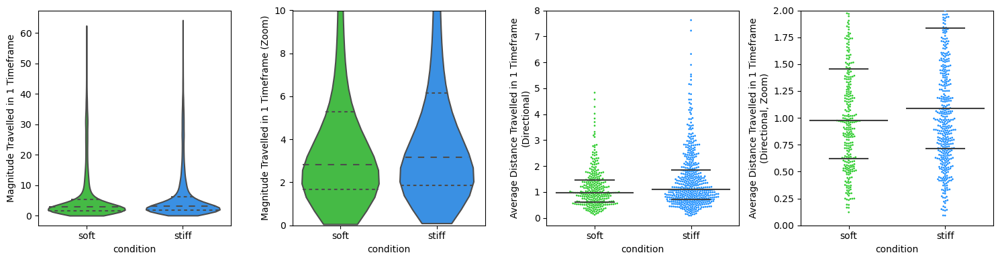

In [78]:
fig, ax = plt.subplots(figsize=(15, 4), ncols=4)
sns.violinplot(data=all_props, x='condition', y='distance_travelled_magnitude', inner="quartile", palette = ["limegreen", "dodgerblue"], ax=ax[0], cut=0)
ax[0].set_ylabel("Magnitude Travelled in 1 Timeframe")
sns.violinplot(data=all_props, x='condition', y='distance_travelled_magnitude', inner="quartile", palette = ["limegreen", "dodgerblue"], ax=ax[1], cut=0)
ax[1].set_ylabel("Magnitude Travelled in 1 Timeframe (Zoom)")
ax[1].set_ylim(0, 10)
sns.swarmplot(data=grouped, x='condition', y='displacement_per_frame', palette = ["limegreen", "dodgerblue"], size=2, ax=ax[2])
sns.boxplot(data=grouped, x='condition', y='displacement_per_frame',  boxprops={'facecolor':'None', "edgecolor":"None"},  whis=0, fliersize=0,zorder=100, ax=ax[2])
from textwrap import wrap
ax[2].set_ylabel('\n'.join(wrap("Average Distance Travelled in 1 Timeframe (Directional)", 50)))

sns.swarmplot(data=grouped, x='condition', y='displacement_per_frame', palette = ["limegreen", "dodgerblue"], size=2, ax=ax[3])
sns.boxplot(data=grouped, x='condition', y='displacement_per_frame',  boxprops={'facecolor':'None', "edgecolor":"None"},  whis=0, fliersize=0,zorder=100, ax=ax[3])
ax[3].set_ylim(0,2)
ax[3].set_ylabel('\n'.join(wrap("Average Distance Travelled in 1 Timeframe (Directional, Zoom)", 50)))
plt.tight_layout()
plt.savefig("distances_travelled.pdf", bbox_inches='tight', transparent=True)

<Axes: xlabel='condition', ylabel='displacement_per_frame'>

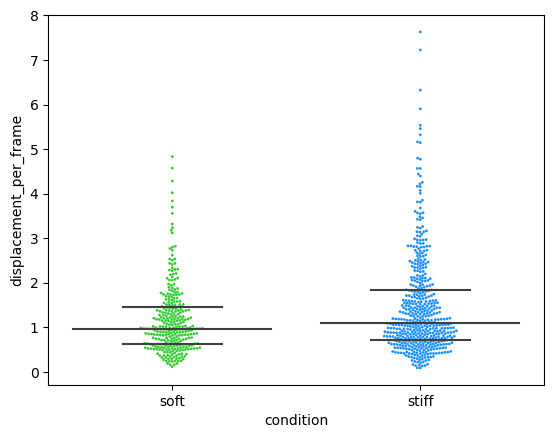

In [10]:
# with tqdm_joblib(tqdm(desc="Image Analysis", total=len(trackmate_paths))) as progress_bar:
#     output = Parallel(n_jobs=2)(delayed(calculate_cell_com)(path) for path in trackmate_paths)

In [7]:
# all_props = pd.concat(output)
# all_props.to_csv("soft_stiff_tracking_first24hr.csv")
all_props = pd.read_csv("soft_stiff_tracking_first24hr.csv")

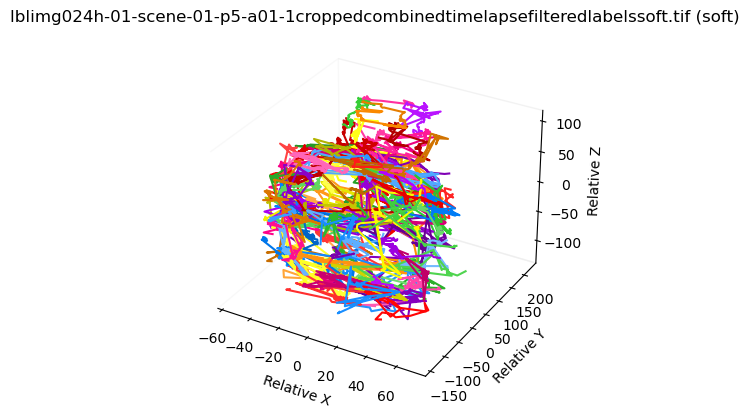

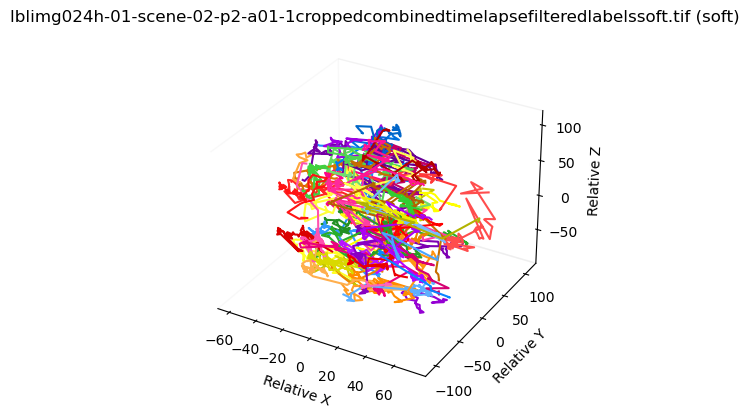

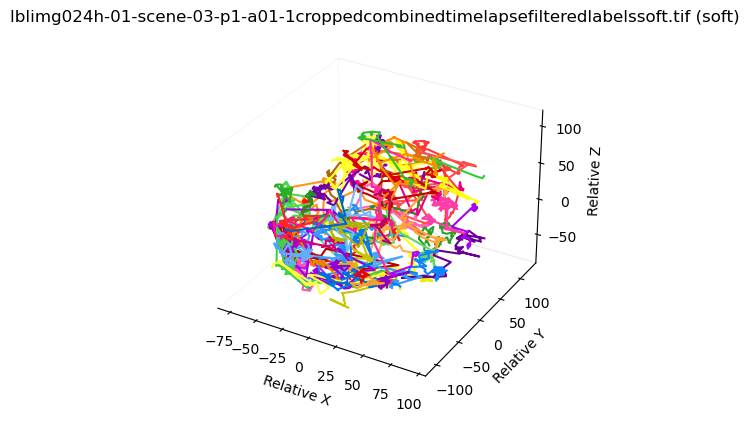

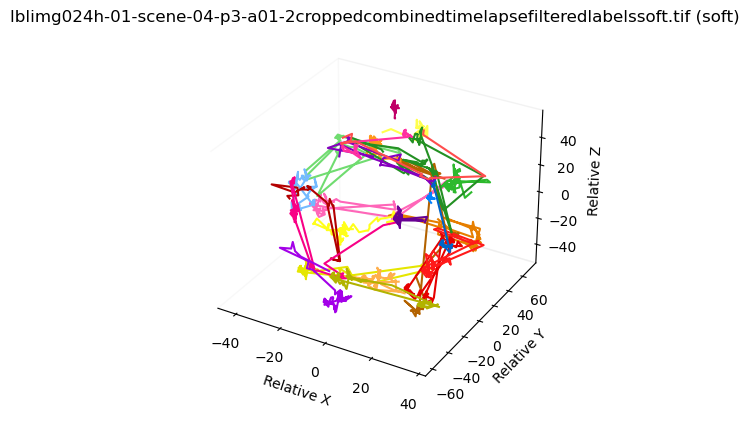

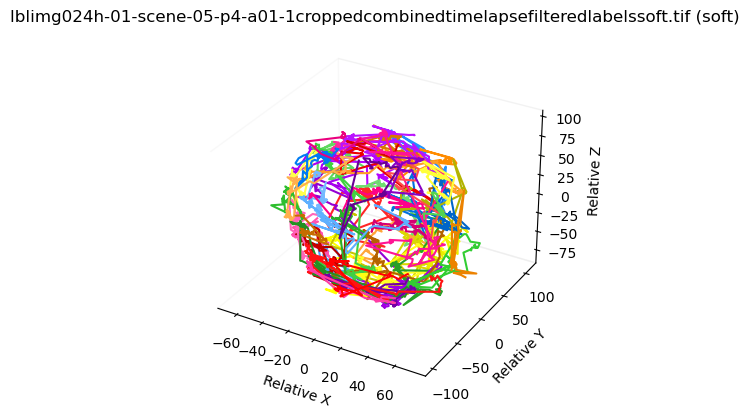

...

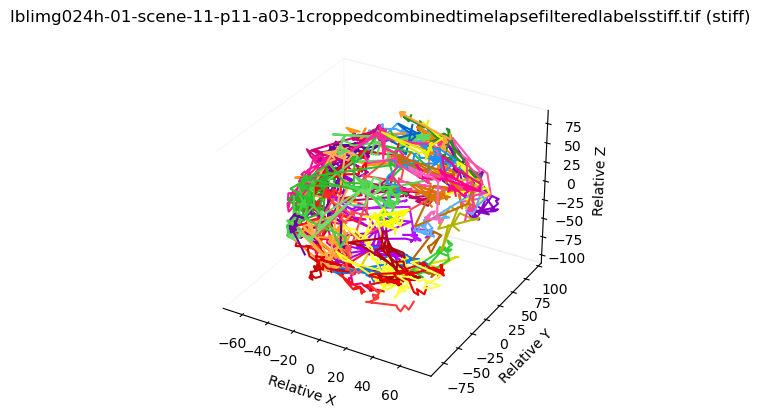

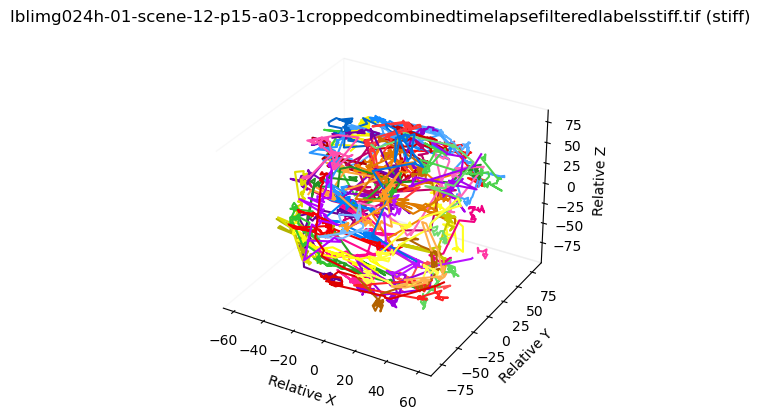

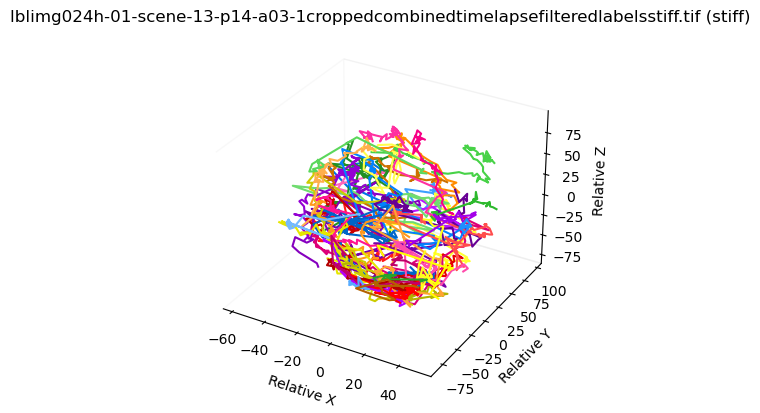

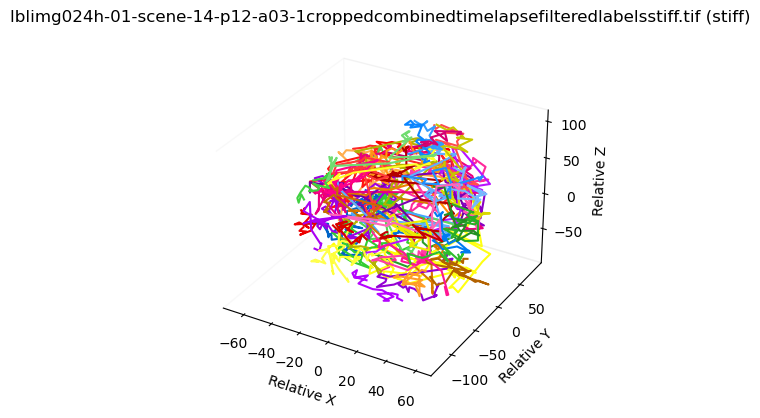

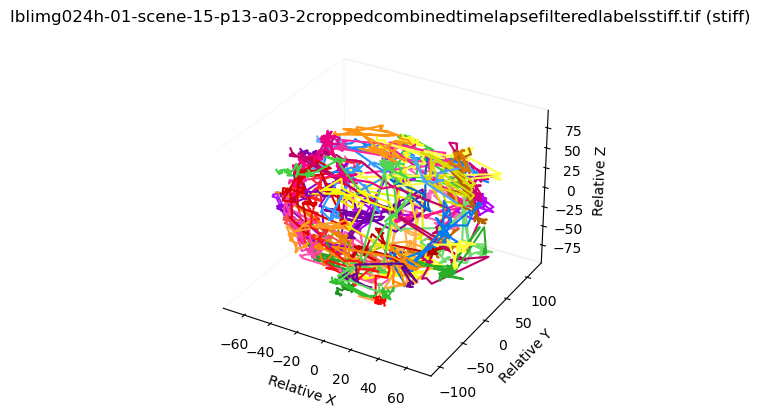

In [ ]:
# all_movement_metrics_df, net_movement_all_df = cartesian_plots_and_info(all_props)
# net_movement_all_df.to_csv("net_movement_individual_cell_frame.csv")
# all_movement_metrics_df.to_csv("total_movement_individual_cell.csv")

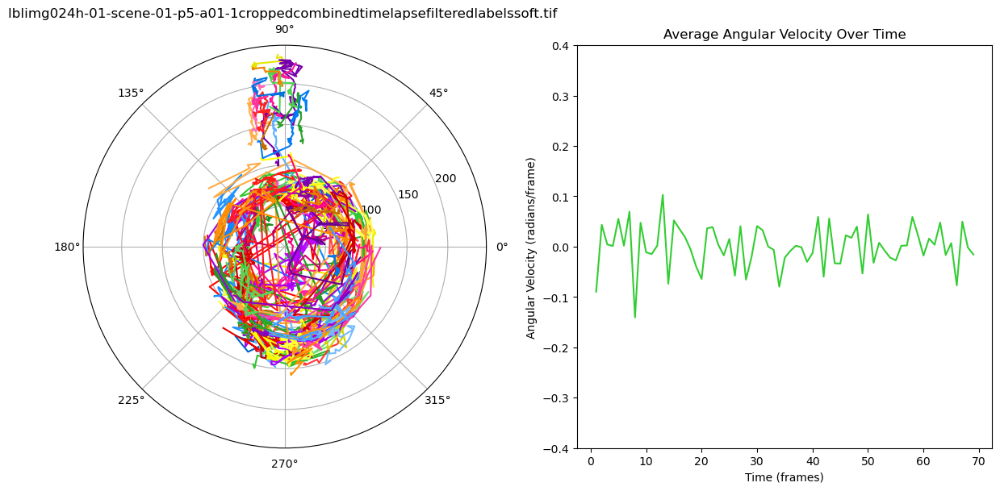

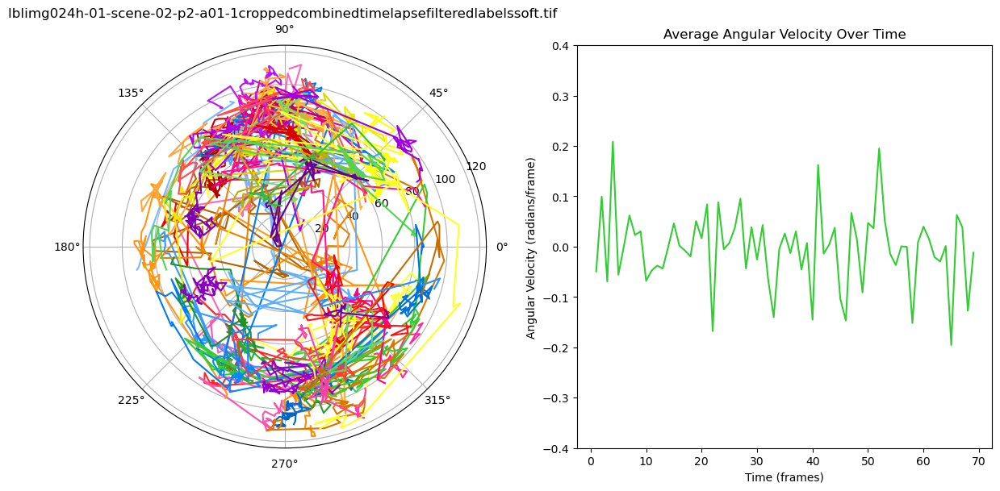

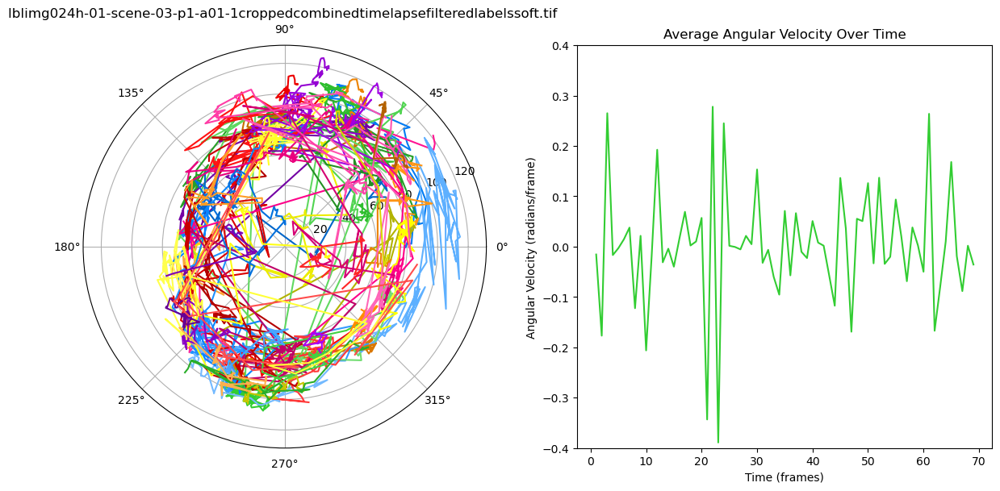

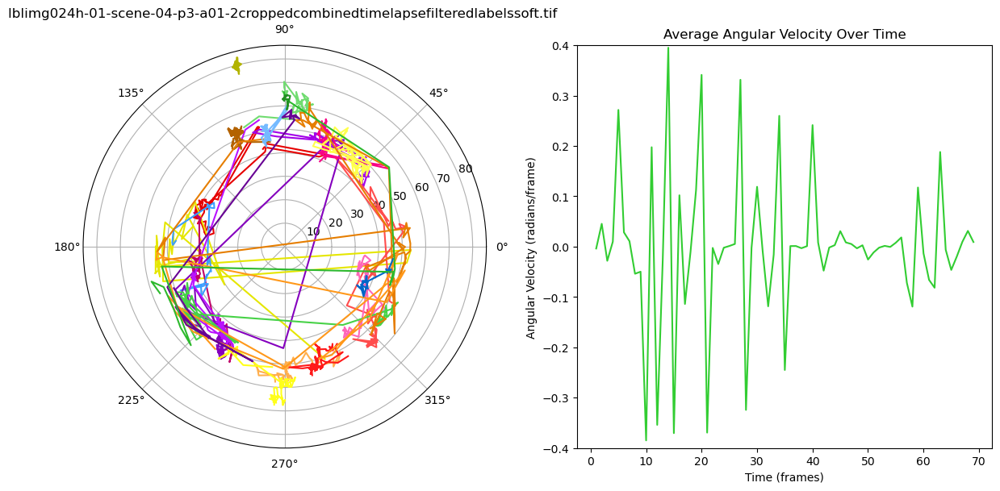

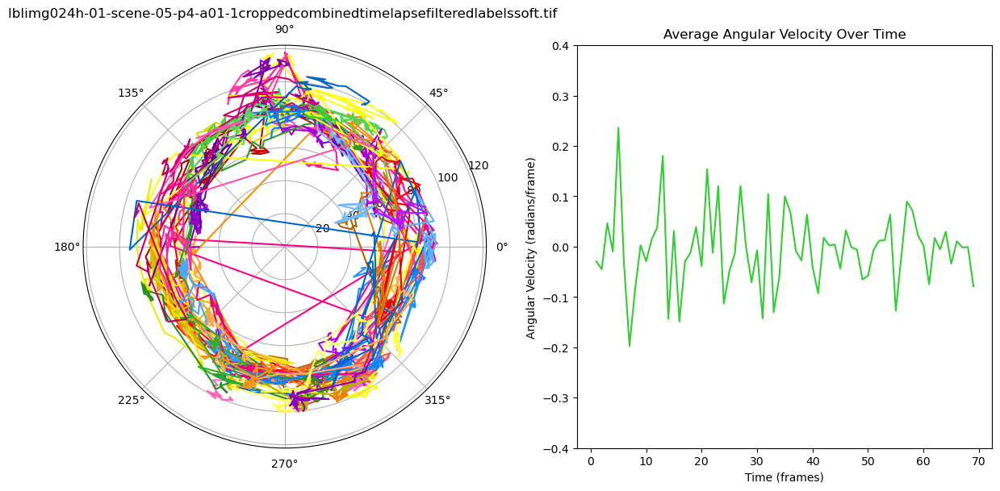

...

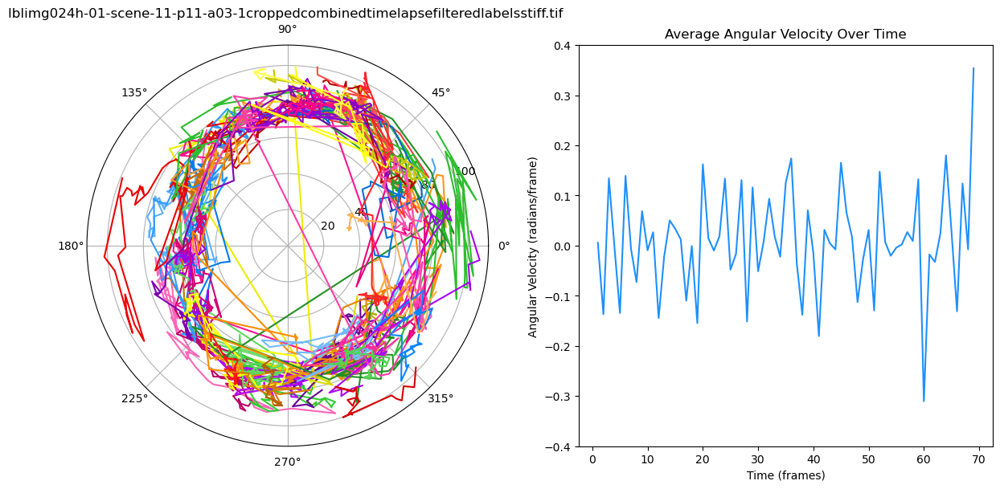

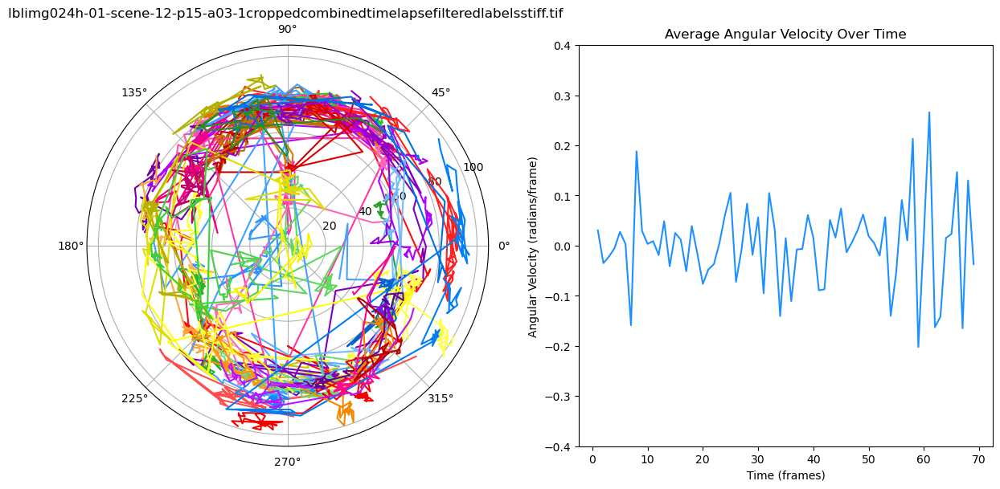

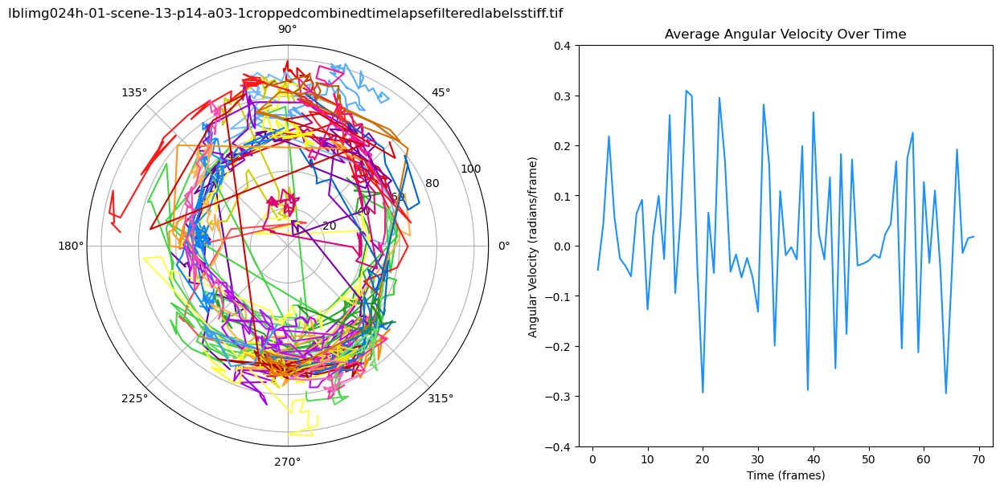

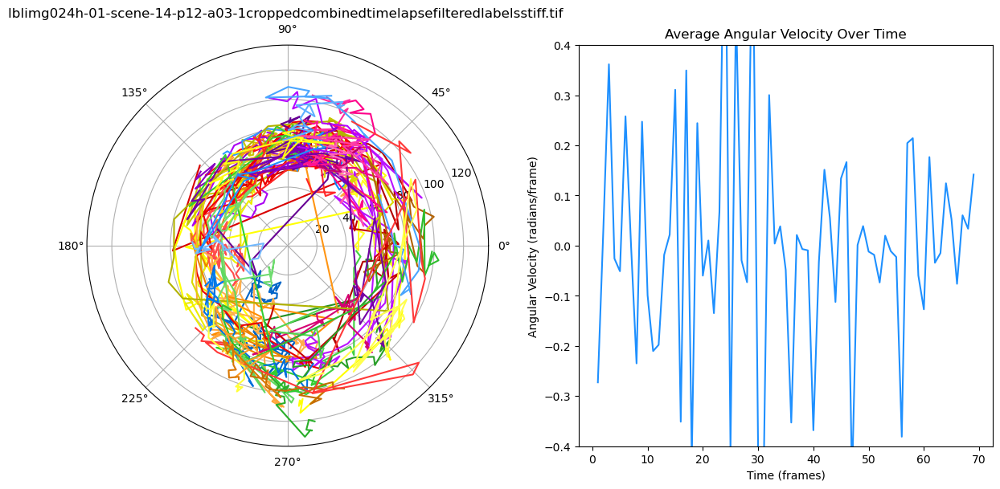

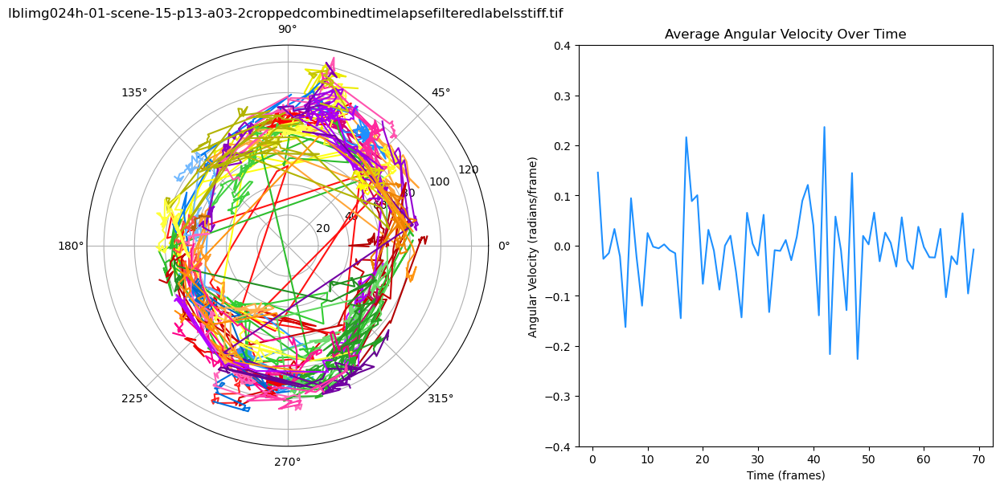

In [ ]:
# all_rotation_metrics_df = polar_plots_and_info(all_props)
# all_rotation_metrics_df.to_csv("soft_stiff_net_rotation.csv")

In [ ]:
net_movement_all_df = pd.read_csv("net_movement_individual_cell_frame.csv") # of each cell between each frame
all_movement_metrics_df = pd.read_csv("total_movement_individual_cell.csv") # of each cell over the full timecourse





In [18]:
total_distance = net_movement_all_df.groupby(["filename", "label","condition"])["total_relative_displacement"].sum().reset_index()
total_distance

,filename,label,condition,total_relative_displacement
0,lblimg024h-01-scene-01-p5-a01-1croppedcombined...,1,soft,113.448604
1,lblimg024h-01-scene-01-p5-a01-1croppedcombined...,2,soft,414.498990
2,lblimg024h-01-scene-01-p5-a01-1croppedcombined...,3,soft,640.104616
3,lblimg024h-01-scene-01-p5-a01-1croppedcombined...,4,soft,434.337111
4,lblimg024h-01-scene-01-p5-a01-1croppedcombined...,5,soft,405.453120
...,...,...,...,...
811,lblimg024h-01-scene-15-p13-a03-2croppedcombine...,56,stiff,222.472541
812,lblimg024h-01-scene-15-p13-a03-2croppedcombine...,57,stiff,150.197951
813,lblimg024h-01-scene-15-p13-a03-2croppedcombine...,58,stiff,158.128235
814,lblimg024h-01-scene-15-p13-a03-2croppedcombine...,59,stiff,46.562880


In [10]:
total_displacements = (
    net_movement_all_df.groupby(["filename", "condition", "label"])
    .agg({
        "relative_displacement_x": "sum",
        "relative_displacement_y": "sum",
        "relative_displacement_z": "sum"
    })
    .reset_index()
)

# Calculate the overall net movement (Euclidean norm)
total_displacements["net_movement"] = (
    total_displacements["relative_displacement_x"]**2 +
    total_displacements["relative_displacement_y"]**2 +
    total_displacements["relative_displacement_z"]**2
).pow(0.5)
total_displacements

,filename,condition,label,relative_displacement_x,relative_displacement_y,relative_displacement_z,net_movement
0,lblimg024h-01-scene-01-p5-a01-1croppedcombined...,soft,1,-28.303095,-14.712425,-4.741317,32.249042
1,lblimg024h-01-scene-01-p5-a01-1croppedcombined...,soft,2,29.236323,-79.641869,26.045537,88.746605
2,lblimg024h-01-scene-01-p5-a01-1croppedcombined...,soft,3,34.924933,98.948941,3.995114,105.007641
3,lblimg024h-01-scene-01-p5-a01-1croppedcombined...,soft,4,-5.635734,-13.469122,-49.255993,51.374425
4,lblimg024h-01-scene-01-p5-a01-1croppedcombined...,soft,5,-1.530738,-2.703020,22.560495,22.773348
...,...,...,...,...,...,...,...
811,lblimg024h-01-scene-15-p13-a03-2croppedcombine...,stiff,56,-21.704579,-5.207740,8.683054,23.950047
812,lblimg024h-01-scene-15-p13-a03-2croppedcombine...,stiff,57,-31.851205,12.716519,4.660085,34.611060
813,lblimg024h-01-scene-15-p13-a03-2croppedcombine...,stiff,58,6.189275,-23.970199,18.458608,30.880378
814,lblimg024h-01-scene-15-p13-a03-2croppedcombine...,stiff,59,-10.511875,-7.281256,5.028539,13.740539


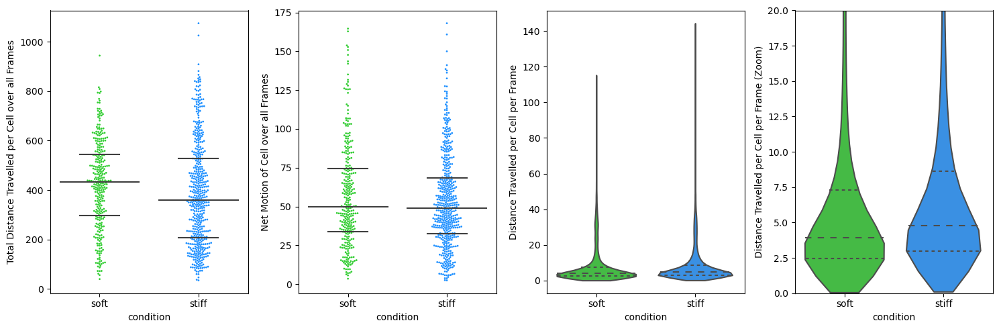

In [22]:
fig, ax = plt.subplots(ncols = 4, figsize=(15, 5))
sns.swarmplot(data=total_distance, x='condition', y='total_relative_displacement', ax=ax[0], size=2, palette=["limegreen", "dodgerblue"])
sns.boxplot(data=total_distance, x='condition', y='total_relative_displacement', ax=ax[0], boxprops={'facecolor':'None', "edgecolor":"None"},  whis=0, fliersize=0,zorder=100)
ax[0].set_ylabel("Total Distance Travelled per Cell over all Frames")


sns.swarmplot(data=total_displacements, x='condition', y='net_movement', ax=ax[1], size=2, palette=["limegreen", "dodgerblue"])
sns.boxplot(data=total_displacements, x='condition', y='net_movement', ax=ax[1], boxprops={'facecolor':'None', "edgecolor":"None"},  whis=0, fliersize=0,zorder=100)
ax[1].set_ylabel("Net Motion of Cell over all Frames")


sns.violinplot(data = net_movement_all_df, x='condition', y='total_relative_displacement', ax=ax[2], palette=["limegreen", "dodgerblue"], inner="quartile", cut=0)
ax[2].set_ylabel("Distance Travelled per Cell per Frame")

sns.violinplot(data = net_movement_all_df, x='condition', y='total_relative_displacement', ax=ax[3], palette=["limegreen", "dodgerblue"], inner="quartile", cut=0)
ax[3].set_ylabel("Distance Travelled per Cell per Frame (Zoom)")
ax[3].set_ylim(0,20)


plt.tight_layout()
plt.savefig("net_displacement_total_distance.pdf", bbox_inches="tight", transparent=True)

In [26]:
all_rotation_metrics_df = pd.read_csv("soft_stiff_net_rotation.csv")
all_rotation_metrics_df["positive_rotation"] = all_rotation_metrics_df["net_rotation"].abs()
total_rotation_df = all_rotation_metrics_df.groupby(["filename", "label","condition"])["net_rotation"].sum().reset_index()
total_rotation_df.rename(columns={"net_rotation": "total_rotation"}, inplace=True)
total_rotation_df["positive_only_total_rotation"] = all_rotation_metrics_df.groupby(["filename", "label","condition"])["positive_rotation"].sum().reset_index()["positive_rotation"]

In [ ]:
total_rotation_df.groupby(["filename", "condition"])["total_rotation"].sum().reset_index()
total_rotation_df.groupby(["filename", "condition"])["positive_only_total_rotation"].sum().reset_index()

,filename,positive_only_total_rotation
0,lblimg024h-01-scene-01-p5-a01-1croppedcombined...,289046.148833
1,lblimg024h-01-scene-02-p2-a01-1croppedcombined...,140799.071612
2,lblimg024h-01-scene-03-p1-a01-1croppedcombined...,126398.976683
3,lblimg024h-01-scene-04-p3-a01-2croppedcombined...,58560.996014
4,lblimg024h-01-scene-05-p4-a01-1croppedcombined...,156813.964350
5,lblimg024h-01-scene-06-p10-a02-2croppedcombine...,116607.384625
6,lblimg024h-01-scene-07-p9-a02-2croppedcombined...,81519.353787
7,lblimg024h-01-scene-08-p8-a02-2croppedcombined...,76487.817871
8,lblimg024h-01-scene-09-p6-a02-2croppedcombined...,86694.541642
9,lblimg024h-01-scene-10-p7-a02-2croppedcombined...,97184.045301


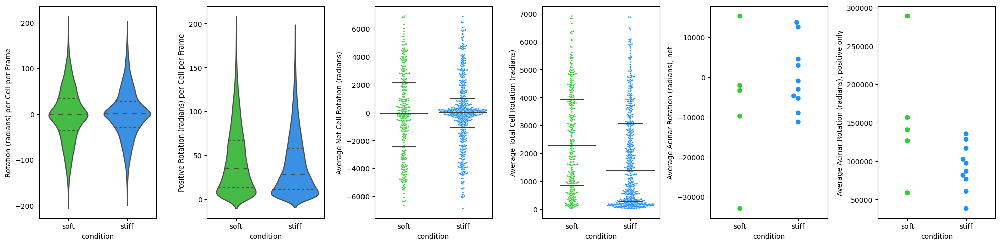

In [43]:
fig, ax = plt.subplots(ncols = 6, figsize=(20, 5))
sns.violinplot(data=all_rotation_metrics_df, x='condition', y='net_rotation', ax=ax[0], size=2, palette=["limegreen", "dodgerblue"], inner="quartile")
ax[0].set_ylabel("Rotation (radians) per Cell per Frame")

sns.violinplot(data=all_rotation_metrics_df, x='condition', y='positive_rotation', ax=ax[1], size=2, palette=["limegreen", "dodgerblue"], inner="quartile")
ax[1].set_ylabel("Positive Rotation (radians) per Cell per Frame")

sns.swarmplot(data=total_rotation_df, x='condition', y='total_rotation', ax=ax[2],  palette=["limegreen", "dodgerblue"], size=2)
sns.boxplot(data=total_rotation_df, x='condition', y='total_rotation', ax=ax[2], boxprops={'facecolor':'None', "edgecolor":"None"},  whis=0, fliersize=0,zorder=100)

ax[2].set_ylabel("Average Net Cell Rotation (radians)")

sns.swarmplot(data=total_rotation_df, x='condition', y='positive_only_total_rotation', ax=ax[3],  palette=["limegreen", "dodgerblue"],size=2)
sns.boxplot(data=total_rotation_df, x='condition', y='positive_only_total_rotation', ax=ax[3], boxprops={'facecolor':'None', "edgecolor":"None"},  whis=0, fliersize=0,zorder=100)

ax[3].set_ylabel("Average Total Cell Rotation (radians)")

sns.swarmplot(data = total_rotation_df.groupby(["filename", "condition"])["total_rotation"].sum().reset_index(), x="condition", y = "total_rotation", ax=ax[4], palette=["limegreen", "dodgerblue"],size=7)
ax[4].set_ylabel("Average Acinar Rotation (radians), net")
sns.swarmplot(data = total_rotation_df.groupby(["filename", "condition"])["positive_only_total_rotation"].sum().reset_index(), x="condition", y = "positive_only_total_rotation", ax=ax[5], palette=["limegreen", "dodgerblue"],size=7)
ax[5].set_ylabel("Average Acinar Rotation (radians), positive only")
plt.tight_layout()



plt.savefig("rotation_metrics.pdf", bbox_inches='tight', transparent=True)

In [80]:

# fig = go.Figure()

# for label, group in grouped:
#     fig.add_trace(go.Scatter3d(
#         x=group['centroid-0'],
#         y=group['centroid-1'],
#         z=group['centroid-2'],
#         mode='lines',
#         name=f'Cell {label}'
#     ))

# fig.update_layout(scene=dict(
#     xaxis_title='X',
#     yaxis_title='Y',
#     zaxis_title='Z'
# ))
# fig.show()

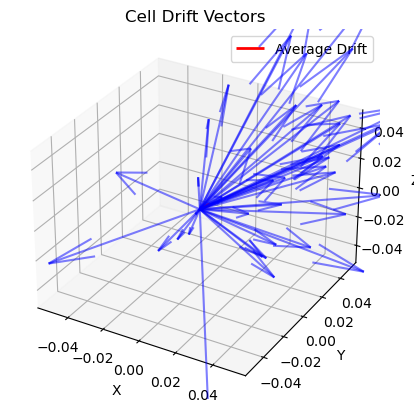

In [18]:

# Ensure data is sorted by frame
df = df.sort_values(by=['label', 'frame'])

# Group by label (cell ID)
grouped = df.groupby('label')

# Initialize lists to store drift vectors
drift_vectors = []

# Calculate individual drifts
for label, group in grouped:
    # Extract initial and final positions
    initial_position = group.iloc[0][['centroid-0', 'centroid-1', 'centroid-2']].to_numpy()
    final_position = group.iloc[-1][['centroid-0', 'centroid-1', 'centroid-2']].to_numpy()
    
    # Calculate drift vector
    drift_vector = final_position - initial_position
    drift_vectors.append(drift_vector)

# Convert to numpy array for averaging
drift_vectors = np.array(drift_vectors)

# Calculate average drift
average_drift = np.mean(drift_vectors, axis=0)

# Plot the drifts
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot individual drift vectors
for vector in drift_vectors:
    ax.quiver(0, 0, 0, vector[0], vector[1], vector[2], color='blue', alpha=0.5, length=0.001)

# Plot average drift vector
ax.quiver(0, 0, 0, average_drift[0], average_drift[1], average_drift[2], color='red', linewidth=2, label='Average Drift', length=0.001)

# Customize the plot
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Cell Drift Vectors')
ax.legend()
plt.show()

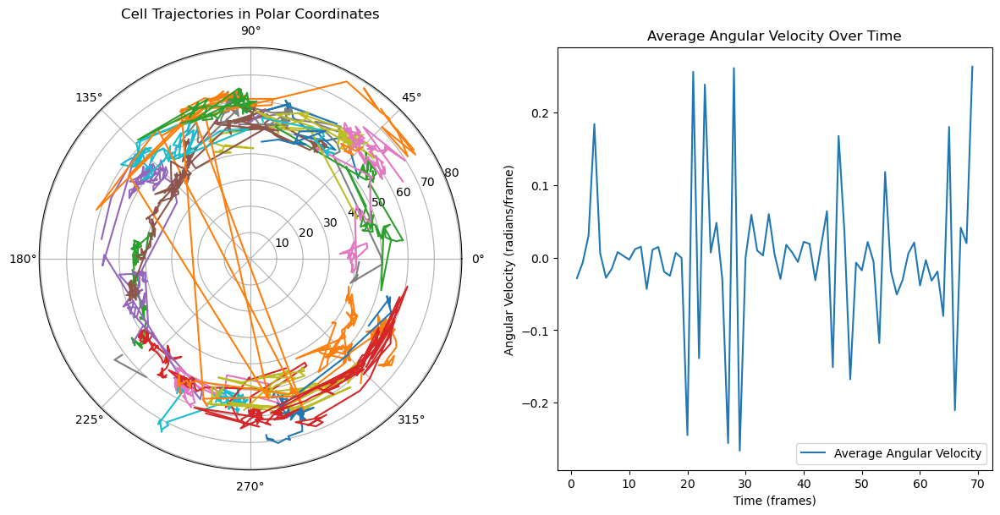

In [ ]:
def plot_outputs_from_csv(csv_path, percentage_of_frames_appeared_in = 50):
#     ### Read in the csv of positions at each timeframe
#     output = pd.read_csv(csv_path)
#     n_timesteps = output["frame"].max()
#     ### Only keep cells that appear in >percentage_of_frames_appeared_in% of frames
#     filtered_props = output[output.groupby("label").transform('size')>(n_timesteps*(percentage_of_frames_appeared_in/100))]
#     ### If any cell has been missed in a frame, fill in its data based on the frame before and after (linear interpolation)
#     ascending_frames = filtered_props.groupby('label').frame.apply(lambda x: pd.Series(np.arange(x.min(), x.max()+1))).reset_index().drop('level_1', axis=1)
#     filtered_props = ascending_frames.merge(filtered_props, how='left')
#     filtered_props.drop('Unnamed: 0', axis=1, inplace=True)
#     filtered_props = filtered_props.groupby('label', as_index=False).apply(lambda x: x.interpolate())
#     ### Normalise so each cell starts at position (0,0)
#     filtered_props['adjusted_x'] = filtered_props.groupby('label')['centroid-0'].transform(lambda x: x - x.iloc[0])
#     filtered_props['adjusted_y'] = filtered_props.groupby('label')['centroid-1'].transform(lambda x: x - x.iloc[0])
#     filtered_props["x_travelled"] = filtered_props["adjusted_x"].diff()
#     filtered_props["y_travelled"] = filtered_props["adjusted_y"].diff()
#     filtered_props["distance_travelled"] = np.sqrt(filtered_props["x_travelled"]**2 + filtered_props["y_travelled"]**2)
#     filtered_props['distance_travelled'].fillna(0, inplace=True)  # Fill NaN values with 0 for the first frame
    
# ##################PLOT DATA FOR EACH TIMESTEP FOR EACH CELL##################

#     # Normalize the distance to get a value between 0 and 1 for the colormap
#     norm = Normalize(vmin=filtered_props['distance_travelled'].min(), vmax=filtered_props['distance_travelled'].max())
#     cmap = plt.get_cmap('coolwarm')  # Colormap from blue (short distance) to red (long distance)
#     sm = ScalarMappable(norm=norm, cmap=cmap)
#     ### Plot the distance travelled by each cell in each timestep
#     plt.figure(figsize=(10, 6))
#     for label, group_df in filtered_props.groupby('label'):
#         # Plot points
#         plt.scatter(group_df['adjusted_x'], group_df['adjusted_y'], label=f'Cell {label}', s=10)
#         # Plot lines with color based on distance
#         prev_x, prev_y = None, None
#         for _, row in group_df.iterrows():
#             if prev_x is not None and prev_y is not None:
#                 plt.plot([prev_x, row['adjusted_x']], [prev_y, row['adjusted_y']], color=sm.to_rgba(row['distance_travelled']), linewidth=1)
#             prev_x, prev_y = row['adjusted_x'], row['adjusted_y']
#     # Adding colorbar to show distance scale
#     cb = plt.colorbar(sm)
#     cb.set_label('Distance Traveled')

#     plt.title('Trajectories of Cells Over Time with Distance-Color Mapping')
#     plt.xlabel('Adjusted X Position')
#     plt.ylabel('Adjusted Y Position')
#     plt.legend()
#     plt.grid(True)
#     plt.show()

# ################## JUST LOOK AT OVERALL DRIFT ##################
#     drift_df = filtered_props.groupby('label')[["label", 'adjusted_x', "adjusted_y"]].tail(1)
#     drift_df["distance_travelled"] = np.sqrt(drift_df["adjusted_x"]**2 + drift_df["adjusted_y"]**2)
#     norm = Normalize(vmin=drift_df['distance_travelled'].min(), vmax=drift_df['distance_travelled'].max())
#     cmap = plt.get_cmap('coolwarm')  # Colormap from blue (short distance) to red (long distance)
#     sm = ScalarMappable(norm=norm, cmap=cmap)
#     for _, row in drift_df.iterrows():
#         # Initial position (0,0) for each cell, you could add a scatter here if you want to visualize the origin
#         # Plot the final position
#         plt.scatter(row['adjusted_x'], row['adjusted_y'], color='black')  # Black to mark the final position
#         # Draw a line from origin to the final position
#         plt.plot([0, row['adjusted_x']], [0, row['adjusted_y']], color=sm.to_rgba(row['distance_travelled']), label=f'Cell {row["label"]}')
#         plt.text(row['adjusted_x']-1, row['adjusted_y']+1, f'{int(row["label"])}', color='black', verticalalignment='bottom', horizontalalignment='right')
#     # Adding colorbar to show distance scale
#     cb = plt.colorbar(sm)
#     cb.set_label('Distance Travelled')

#     plt.title('Final Positions of Cells with Distance-Color Mapping')
#     plt.xlabel('Adjusted X Position')
#     plt.ylabel('Adjusted Y Position')
#     #plt.legend()
#     plt.grid(True)
#     plt.show()



In [41]:
##########EXTRA_STEP _ COMBINE CSVS FOR REPLICATES ########
def return_concatenated_df(folder):
    csv_paths = list(pathlib.Path(".//csv_outputs//{}".format(folder)).glob("**/*.csv"))
    dataframes = [pd.read_csv(csv_path) for csv_path in csv_paths]
    concatenated_df = pd.concat(dataframes, ignore_index=True)
    concatenated_df.to_csv(".//csv_outputs//totals//TOTAL_{}.csv".format(folder))

In [44]:
for folder in ["G12C_Treated", "G12C_Untreated","G12D_Treated", "G12D_Untreated", "Par_Treated", "Par_Untreated"]:
    return_concatenated_df(folder)

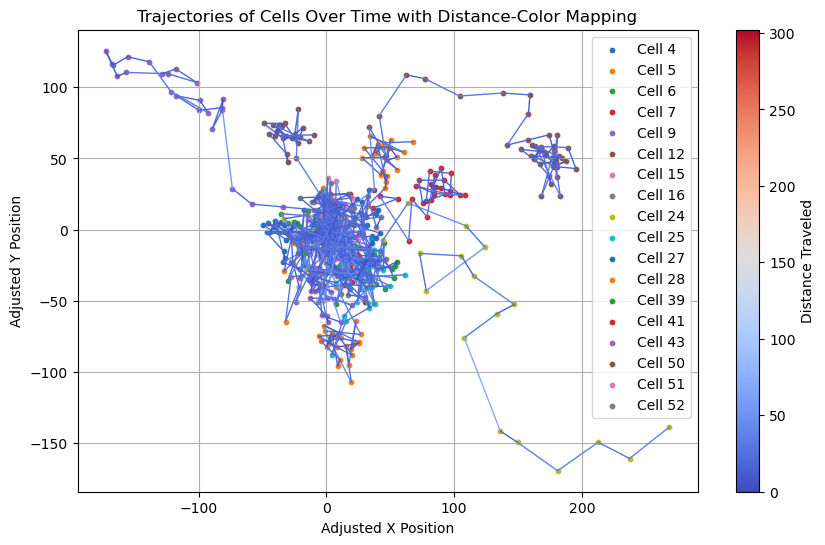

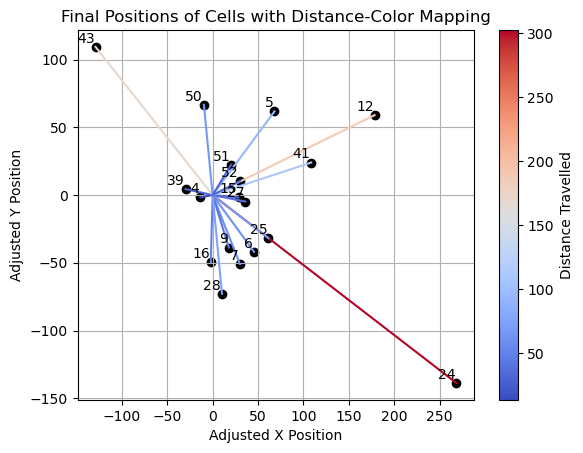

In [186]:
# untreated_csv_path = "C:\\Users\\isobe\Dropbox (The University of Manchester)\\Python\\Data_For_Others\\Emmanouela\\Outputs\\LblImg_B1_COC_G12C_Untr_1_cellpose_segmentation_output.csv"
# treated_csv_path = "C:\\Users\\isobe\\Dropbox (The University of Manchester)\\Python\\Data_For_Others\\Emmanouela\\Outputs\\LblImg_B1_COC_G12C_Treat_1_cellpose_segmentation_output.csv"
# plot_outputs_from_csv(untreated_csv_path,  percentage_of_frames_appeared_in = 50)

In [234]:
def return_df_to_plot(output, treatment):
    df = output[output["treatment"]==treatment]
    df = df[df.groupby("label").transform('size')>(n_timesteps*(percentage_of_frames_appeared_in/100))]
    ### If any cell has been missed in a frame, fill in its data based on the frame before and after (linear interpolation)
    ascending_frames = df.groupby('label').frame.apply(lambda x: pd.Series(np.arange(x.min(), x.max()+1))).reset_index().drop('level_1', axis=1)
    df = ascending_frames.merge(df, how='left')
    df.drop('Unnamed: 0', axis=1, inplace=True)
    df = df.groupby('label', as_index=False).apply(lambda x: x.interpolate())
    ### Normalise so each cell starts at position (0,0)
    df['adjusted_x'] = df.groupby('label')['centroid-0'].transform(lambda x: x - x.iloc[0])
    df['adjusted_y'] = df.groupby('label')['centroid-1'].transform(lambda x: x - x.iloc[0])
    df["x_travelled"] = df["adjusted_x"].diff()
    df["y_travelled"] = df["adjusted_y"].diff()
    df.loc[((df["adjusted_x"] == 0)	& (df["adjusted_y"] == 0)), "x_travelled"] = 0
    df.loc[((df["adjusted_x"] == 0)	& (df["adjusted_y"] == 0)), "y_travelled"] = 0
    df["distance_travelled"] = np.sqrt(df["x_travelled"]**2 + df["y_travelled"]**2)
    df['distance_travelled'].fillna(0, inplace=True)  # Fill NaN values with 0 for the first frame
    return df

In [251]:
def plot_all_outputs(untreated_csv_path, treated_csv_path, identifier, percentage_of_frames_appeared_in = 50):
    treated_output = pd.read_csv(treated_csv_path)
    treated_output["treatment"] = "treated"
    untreated_output = pd.read_csv(untreated_csv_path)
    untreated_output["treatment"] = "untreated"

    ### Read in the csv of positions at each timeframe
    output = pd.concat([treated_output, untreated_output])
    n_timesteps = output["frame"].max()
    ### Only keep cells that appear in >percentage_of_frames_appeared_in% of frames

    filtered_treated_props = return_df_to_plot(output, "treated")
    filtered_untreated_props = return_df_to_plot(output, "untreated")

    total_filtered_props = pd.concat([filtered_treated_props, filtered_untreated_props])
    max_x = total_filtered_props["adjusted_x"].max()
    min_x = total_filtered_props["adjusted_x"].min()
    max_y = total_filtered_props["adjusted_y"].max()
    min_y = total_filtered_props["adjusted_y"].min()

    ##################PLOT DATA FOR EACH TIMESTEP FOR EACH CELL##################

    # Normalize the distance to get a value between 0 and 1 for the colormap
    norm = Normalize(vmin=total_filtered_props['distance_travelled'].min(), vmax=total_filtered_props['distance_travelled'].max())
    print("min and max dist are {} and {}".format(total_filtered_props['distance_travelled'].min(), total_filtered_props['distance_travelled'].max()))
    cmap = plt.get_cmap('coolwarm')  # Colormap from blue (short distance) to red (long distance)
    sm = ScalarMappable(norm=norm, cmap=cmap)

    ### Plot the distance travelled by each cell in each timestep
    fig, ax = plt.subplots(ncols = 2, figsize=(20,6))
    for i, df in enumerate([filtered_untreated_props, filtered_treated_props]):
        for label, group_df in df.groupby('label'):
            # Plot points
            ax[i].scatter(group_df['adjusted_x'], group_df['adjusted_y'], label=f'Cell {label}', s=5)
            ax[i].set_xlim(1.1*min_x, 1.1*max_x)
            ax[i].set_ylim(1.1*min_y, 1.1*max_y)
            ax[i].set_xlabel('Adjusted X Position')
            ax[i].set_ylabel('Adjusted Y Position')
            ax[i].legend()
            # Plot lines with color based on distance
            prev_x, prev_y = None, None
            for _, row in group_df.iterrows():
                if prev_x is not None and prev_y is not None:
                    ax[i].plot([prev_x, row['adjusted_x']], [prev_y, row['adjusted_y']], color=sm.to_rgba(row['distance_travelled']), linewidth=1, alpha=0.5)
                prev_x, prev_y = row['adjusted_x'], row['adjusted_y']
    # Adding colorbar to show distance scale
    cb = plt.colorbar(sm)
    cb.set_label('Distance Traveled')
    ax[0].set_title("Untreated")
    ax[1].set_title("Treated")
    fig = plt.gcf()
    plt.savefig("{}_all_paths.png".format(identifier), bbox_inches="tight")


    ################## JUST LOOK AT OVERALL DRIFT ##################
    drift_df_treated = filtered_treated_props.groupby('label')[["label", 'adjusted_x', "adjusted_y", "treatment"]].tail(1)
    drift_df_untreated = filtered_untreated_props.groupby('label')[["label", 'adjusted_x', "adjusted_y", "treatment"]].tail(1)
    total_drift_df = pd.concat([drift_df_treated, drift_df_untreated])
    total_drift_df["distance_travelled"] = np.sqrt(total_drift_df["adjusted_x"]**2 + total_drift_df["adjusted_y"]**2)
    total_drift_df.to_csv("drift_data_{}.csv".format(identifier))
    norm = Normalize(vmin=total_drift_df['distance_travelled'].min(), vmax=total_drift_df['distance_travelled'].max())
    print("min and max dist are {} and {}".format(total_drift_df['distance_travelled'].min(), total_drift_df['distance_travelled'].max()))
    max_x = total_drift_df["adjusted_x"].max()
    min_x = total_drift_df["adjusted_x"].min()
    max_y = total_drift_df["adjusted_y"].max()
    min_y = total_drift_df["adjusted_y"].min()
    cmap = plt.get_cmap('coolwarm')  # Colormap from blue (short distance) to red (long distance)
    sm = ScalarMappable(norm=norm, cmap=cmap)

    drift_df_treated = total_drift_df[total_drift_df["treatment"]=="treated"]
    drift_df_untreated = total_drift_df[total_drift_df["treatment"]=="untreated"]
    fig, ax = plt.subplots(ncols = 2, figsize=(20,6))
    for i, df in enumerate([drift_df_untreated, drift_df_treated]):
        for _, row in df.iterrows():
            # Initial position (0,0) for each cell, you could add a scatter here if you want to visualize the origin
            # Plot the final position
            ax[i].scatter(row['adjusted_x'], row['adjusted_y'], color='black')  # Black to mark the final position
            # Draw a line from origin to the final position
            ax[i].plot([0, row['adjusted_x']], [0, row['adjusted_y']], color=sm.to_rgba(row['distance_travelled']), label=f'Cell {row["label"]}')
            ax[i].text(row['adjusted_x']-1, row['adjusted_y']+1, f'{int(row["label"])}', color='black', verticalalignment='bottom', horizontalalignment='right')
            ax[i].set_xlim(1.1*min_x, 1.1*max_x)
            ax[i].set_ylim(1.1*min_y, 1.1*max_y)
        # Adding colorbar to show distance scale
    cb = plt.colorbar(sm)
    cb.set_label('Distance Travelled')
    ax[0].set_title("Untreated")
    ax[1].set_title("Treated")
    fig = plt.gcf()
    plt.savefig("{}_overall_drift.png".format(identifier), bbox_inches="tight")


    fig, ax = plt.subplots(figsize=(4,4))
    sns.swarmplot(data = total_drift_df, x="treatment", y= "distance_travelled", palette=["red", "blue"], ax=ax)
    fig = plt.gcf()
    plt.savefig("{}_drift_swarm.png".format(identifier), bbox_inches="tight")

min and max dist are 0.0 and 99.9544066790368
min and max dist are 9.377441286032983 and 302.1787499383225


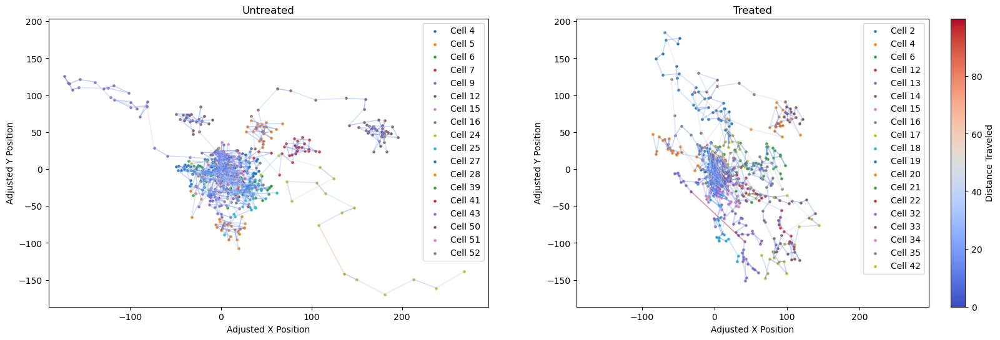

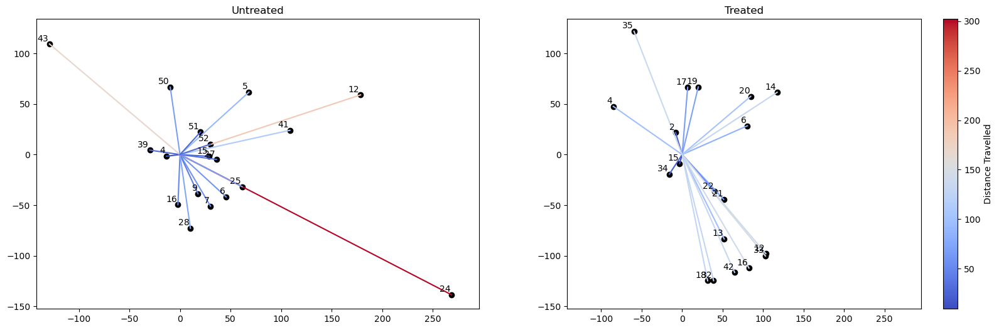

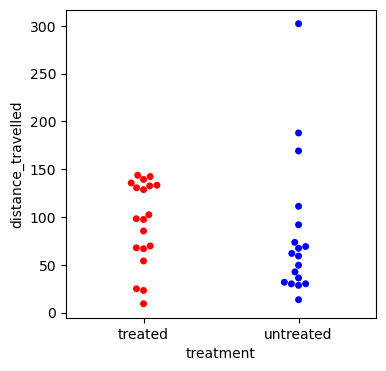

In [252]:
# def plot_outputs_from_csv(untreated_csv_path, treated_csv_path, percentage_of_frames_appeared_in = 50):
untreated_csv_path = "C:\\Users\\isobe\Dropbox (The University of Manchester)\\Python\\Data_For_Others\\Emmanouela\\Outputs\\LblImg_B1_COC_G12C_Untr_1_cellpose_segmentation_output.csv"
treated_csv_path = "C:\\Users\\isobe\\Dropbox (The University of Manchester)\\Python\\Data_For_Others\\Emmanouela\\Outputs\\LblImg_B1_COC_G12C_Treat_1_cellpose_segmentation_output.csv"
percentage_of_frames_appeared_in = 50
plot_all_outputs(untreated_csv_path, treated_csv_path, "B1_COC_G12C", percentage_of_frames_appeared_in = 50)

min and max dist are 0.0 and 122.16597468276301
min and max dist are 5.712885907656193 and 711.816047776968


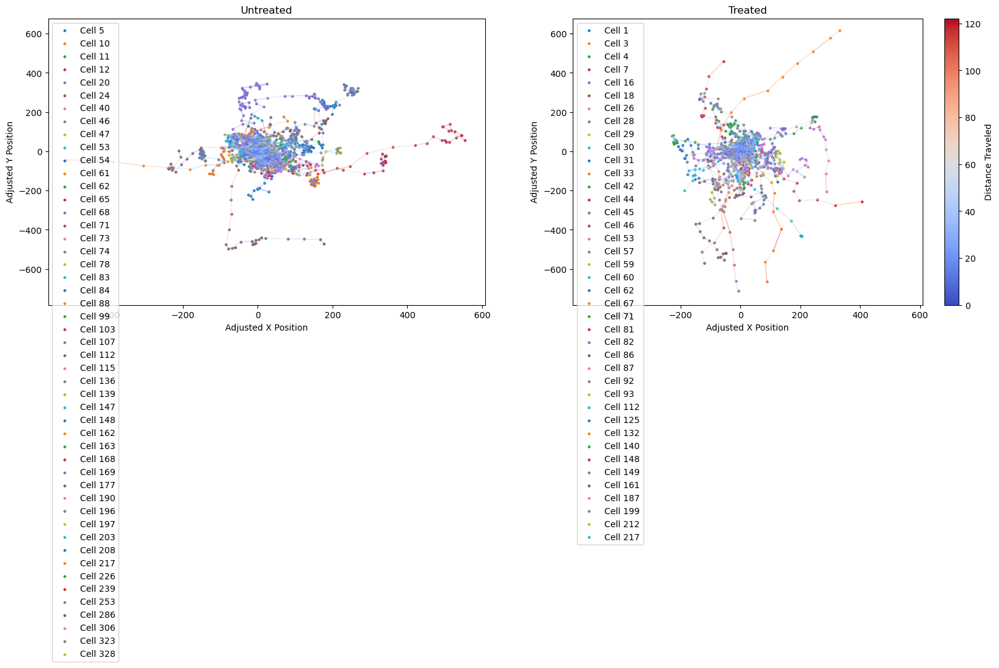

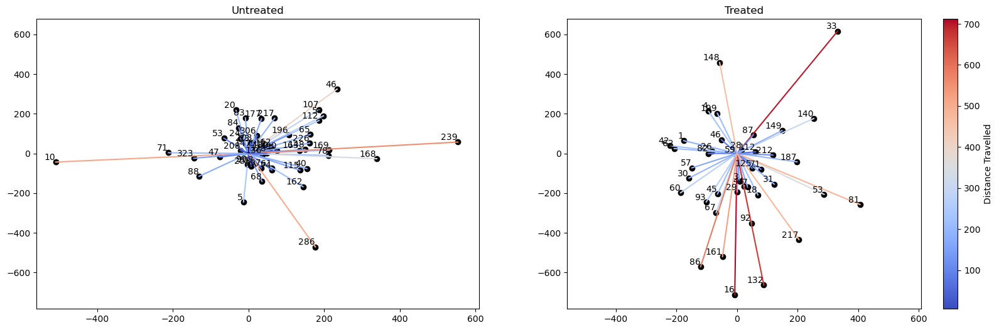

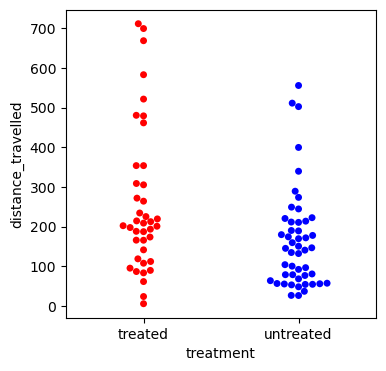

In [253]:
treated_csv_path = "C:\\Users\\isobe\\Dropbox (The University of Manchester)\\Python\\Data_For_Others\\Emmanouela\\Outputs\\LblImg_B1_G12C_Treat_1_cellpose_segmentation_output.csv"
untreated_csv_path = "C:\\Users\\isobe\\Dropbox (The University of Manchester)\\Python\\Data_For_Others\\Emmanouela\\Outputs\\LblImg_B1_G12C_Untr_1_cellpose_segmentation_output.csv"

percentage_of_frames_appeared_in = 50
plot_all_outputs(untreated_csv_path, treated_csv_path, "B1_G12C", percentage_of_frames_appeared_in = 50)

min and max dist are 0.0 and 97.77718426587319
min and max dist are 10.343050847472053 and 659.4233508451861


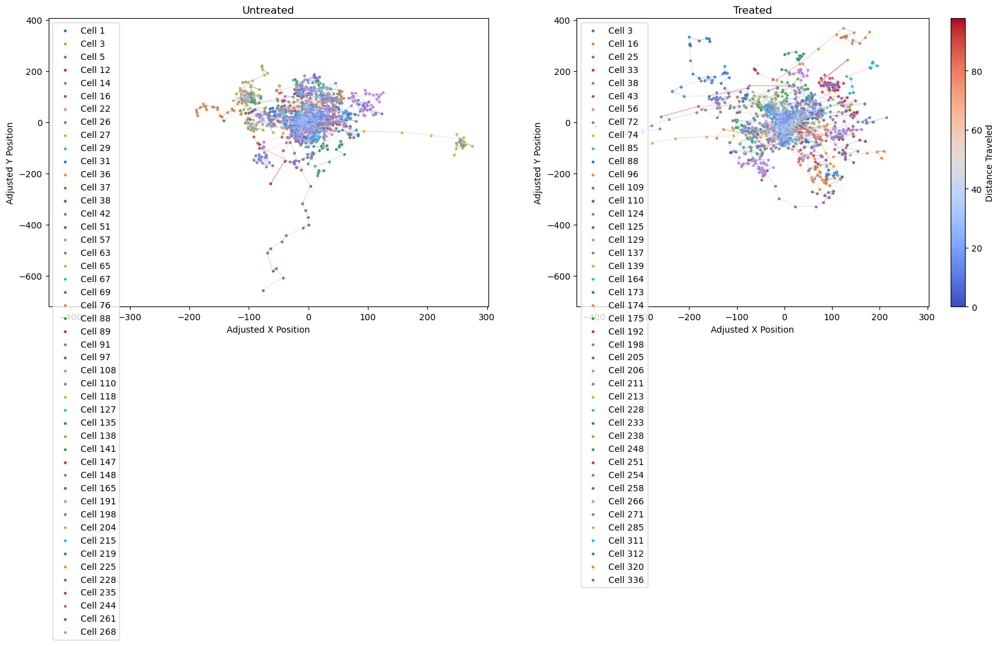

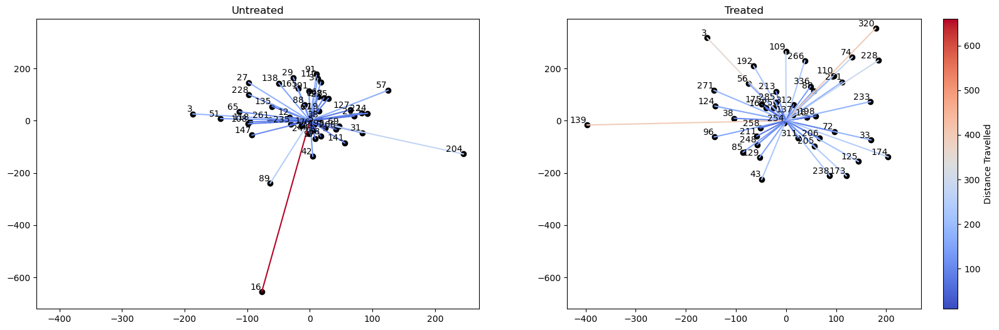

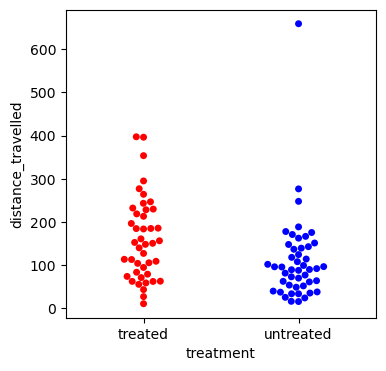

In [254]:
treated_csv_path = ".\\Outputs\\LblImg_B1_G12D_Treat_1_cellpose_segmentation_output.csv"
untreated_csv_path = ".\\Outputs\\LblImg_B1_G12D_Untr_1_cellpose_segmentation_output.csv"

percentage_of_frames_appeared_in = 50
plot_all_outputs(untreated_csv_path, treated_csv_path, "B1_G12D", percentage_of_frames_appeared_in = 50)
